# ***Urdu***

## **EDA of urdu Dataset**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import random

In [2]:
from google.colab import drive
drive.mount('//content//drive')

Mounted at //content//drive


In [3]:
df1=pd.read_excel("/content/drive/MyDrive/NLP1_CSE431/for_urdu/urdu_dataset/urdu_final__label_dataset.xlsx")


In [4]:
df1.to_excel('urdu_dataset.xlsx', index=False)

In [5]:
df = df1.dropna(subset=["comment"]).replace(["NaN", ""], float("nan")).dropna(subset=["brand"])

df = df1.dropna(subset=["label"]).replace(["NaN", ""], float("nan")).dropna(subset=["label"])

df['gender'] = df1['gender'].replace('male', 'Male')
df['gender'] = df1['gender'].replace('fmale', 'Female')

# df = df.dropna(subset=["gebder"]).replace(["NaN", ""], float("nan")).dropna(subset=["gender"])

df

,user_name,comment,brand,gender,label
0,Muhammad Ahmed,میں نے حال ہی میں ایک ڈیل لیپ ٹاپ خریدا تھا ، ...,Dell,Male,1.0
1,Fatima Ali,میں برسوں سے ایک hp لیپ ٹاپ استعمال کر رہا ہوں...,HP,Female,1.0
2,Ali Hassan,لینووو لیپ ٹاپ لاجواب ہیں۔کی بورڈ ٹائپ کرنے می...,Lenovo,Male,1.0
3,Aisha Khan,ایپل میک بوکس وہاں کے بہترین لیپ ٹاپ ہیں۔ڈیزائ...,Apple,Female,1.0
4,Usman Malik,میں asus لیپ ٹاپ کا بہت بڑا پرستار ہوں۔وہ طاقت...,Asus,Male,1.0
...,...,...,...,...,...
3031,shiva ganesh,بھائی بہت سے لوگ ایم آئی نوٹ بک اور اسوس کو تر...,Asus,Male,0.0
3032,kpop_pabo,براہ کرم میک بوک پرو کا جائزہ لیں,Apple,Female,2.0
3033,anonim mus,میں پروگرامنگ کر رہا ہوں ، کیا مجھے انٹیل یا ر...,Asus,Female,2.0
3034,Dr. Satyam Upadhyay,اس کے پاس گیمنگ پی سی ہے,Gigabyte,Male,2.0


In [6]:
df.groupby("label").describe()

user_name                               comment         \
          count unique               top freq   count unique   
label                                                          
0.0         858    475  Shahista Khatoon   30     858    849   
1.0        1259    844         Miss Zuha   12    1259   1223   
2.0         814    757            Ayesha    3     814    788   

                                                              brand         \
                                                     top freq count unique   
label                                                                        
0.0    asus لیپ ٹاپ دستیاب ٹھنڈک کے اختیارات کی ایک م...    2   858     28   
1.0    لینوو یوگا بوک c940 بہترین قابلیتوں کے ساتھ آت...    3  1259     27   
2.0              اس Razer لیپ ٹاپ کی گیمنگ کیسی ہوتی ہے؟    2   814     40   

                   gender                    
          top freq  count unique   top freq  
label                                        
0.0    Lenovo  148    858      2  Male  463  
1.0    Lenovo  308   1259      2  Male  831  
2.0      Asus  170    814      2  Male  548

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Matplotlib currently does not support Arabic natively.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 1748 (\N{ARABIC FULL STOP}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128170 (\N{FLEXED BICEPS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/

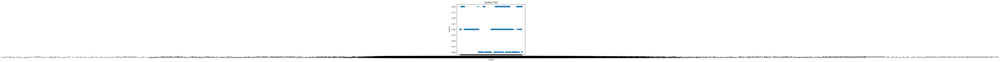

In [ ]:
import matplotlib.pyplot as plt

# Generate some random data
x = df["comment"]
y = df["label"]

# Create a scatter plot
plt.scatter(x, y)

# Add labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Scatter Plot')

# Display the plot
plt.show()


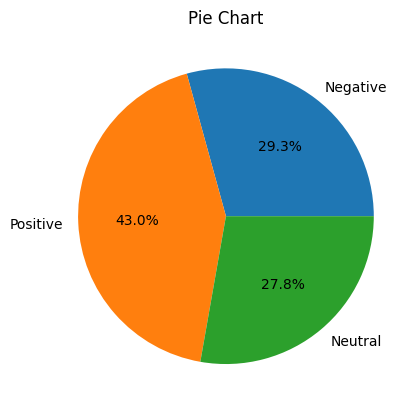

In [7]:
import matplotlib.pyplot as plt

# Filter the data for label = 0 and label = 1
label_0_data = df[df["label"] == 0]
label_1_data = df[df["label"] == 1]
label_2_data = df[df["label"] == 2]

# Get the sizes for each category
label_0_size = len(label_0_data)
label_1_size = len(label_1_data)
label_2_size = len(label_2_data)

# Create a pie chart
sizes = [label_0_size, label_1_size, label_2_size]
labels = ['Negative', 'Positive', 'Neutral']
plt.pie(sizes, labels=labels, autopct='%1.1f%%')

# Add title
plt.title('Pie Chart')

# Display the plot
plt.show()


###Over-sampling (Up Sampling):
This technique is used to modify the unequal data classes to create balanced datasets. When the quantity of data is insufficient, the oversampling method tries to balance by incrementing the size of rare samples.

In [8]:
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import RandomOverSampler

# Separate the features (comments, user names, brand names, gender) and the labels
X_comments = df['comment'].values.reshape(-1, 1)  # Convert to 2D array
X_users = df['user_name'].values.reshape(-1, 1)  # Convert to 2D array
X_brands = df['brand'].values.reshape(-1, 1)  # Convert to 2D array
X_gender = df['gender'].values.reshape(-1, 1)  # Convert to 2D array

# Encode the "gender" column to numerical representation (if needed)
gender_encoder = LabelEncoder()
X_gender_encoded = gender_encoder.fit_transform(X_gender)

y = df['label']

# Count the class distribution
class_counts = y.value_counts()
print("Class distribution before balancing:")
print(class_counts)

# Determine the target class size (maximum class count)
target_size = max(class_counts)

# Combine features (comments, user names, brand names, gender) into a single DataFrame
X_features = pd.concat([
    pd.DataFrame(X_comments, columns=['comment']),
    pd.DataFrame(X_users, columns=['user_name']),
    pd.DataFrame(X_brands, columns=['brand']),
    pd.DataFrame(X_gender_encoded, columns=['gender'])  # Use the encoded gender
], axis=1)

# Oversample all classes (label 0, label 1, label 2)
oversampler = RandomOverSampler(sampling_strategy={0: target_size, 1: target_size, 2: target_size})
X_balanced, y_balanced = oversampler.fit_resample(X_features, y)

# Count the class distribution after balancing
balanced_class_counts = y_balanced.value_counts()
print("\nClass distribution after balancing:")
print(balanced_class_counts)

# Decode the encoded gender back to its original labels
X_balanced['gender'] = gender_encoder.inverse_transform(X_balanced['gender'])

# Save the balanced data to a new .xlsx file
df = pd.concat([X_balanced, y_balanced], axis=1)


Class distribution before balancing:
1.0    1259
0.0     858
2.0     814
Name: label, dtype: int64

Class distribution after balancing:
1.0    1259
2.0    1259
0.0    1259
Name: label, dtype: int64


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [9]:
df

,comment,user_name,brand,gender,label
0,میں نے حال ہی میں ایک ڈیل لیپ ٹاپ خریدا تھا ، ...,Muhammad Ahmed,Dell,Male,1.0
1,میں برسوں سے ایک hp لیپ ٹاپ استعمال کر رہا ہوں...,Fatima Ali,HP,Female,1.0
2,لینووو لیپ ٹاپ لاجواب ہیں۔کی بورڈ ٹائپ کرنے می...,Ali Hassan,Lenovo,Male,1.0
3,ایپل میک بوکس وہاں کے بہترین لیپ ٹاپ ہیں۔ڈیزائ...,Aisha Khan,Apple,Female,1.0
4,میں asus لیپ ٹاپ کا بہت بڑا پرستار ہوں۔وہ طاقت...,Usman Malik,Asus,Male,1.0
...,...,...,...,...,...
3772,جناب میں گیم اینڈروئیڈ گیم ڈویلپمنٹ کے لئے میک...,dhairya agarwal,Apple,Male,2.0
3773,ماؤس سیریل 2 پورٹ سے منسلک تھا۔میرے پاس A &#39...,Gaso Meter,NEC,Male,2.0
3774,جناب ASUS vivobook پرو 15 OLED کے بارے میں کیا...,Piyush Kumar Jha,Asus,Male,2.0
3775,Samsung لیپ ٹاپ برانڈ کی قیمت کیسی ہوتی ہے؟,Salma,Samsung,Female,2.0


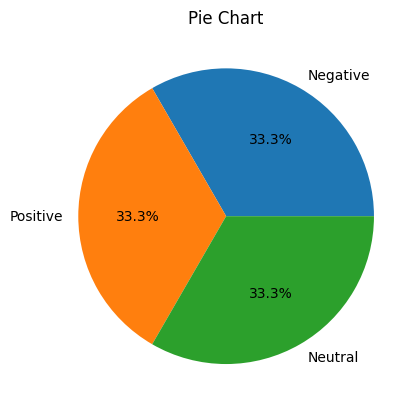

In [10]:
import matplotlib.pyplot as plt

# Filter the data for label = 0 and label = 1
label_0_data = df[df["label"] == 0]
label_1_data = df[df["label"] == 1]
label_2_data = df[df["label"] == 2]

# Get the sizes for each category
label_0_size = len(label_0_data)
label_1_size = len(label_1_data)
label_2_size = len(label_2_data)

# Create a pie chart
sizes = [label_0_size, label_1_size, label_2_size]
labels = ['Negative', 'Positive', 'Neutral']
plt.pie(sizes, labels=labels, autopct='%1.1f%%')

# Add title
plt.title('Pie Chart')

# Display the plot
plt.show()


In [12]:
df.to_excel("Lable_Urdu_Final_Dataset.xlsx", index=False)


In [ ]:
dfbert= df

## **Preprocess raw text for Sentiment analysis**

**Preprocess raw text for Sentiment analysis**

Data preprocessing is one of the critical steps in any machine learning project. It includes cleaning and formatting the data before feeding into a machine learning algorithm. For NLP, the preprocessing steps are comprised of the following tasks:

Tokenizing the string

Lowercasing

Removing stop words and punctuation

Stemming

### Remove punctuations

In [ ]:
import string
urdu_punctuations = "؛؟،٫٬«»‘’“”(){}[]:;،.?!~@#$%^&*+-*/_=<>"
df['comment'] = df['comment'].apply(lambda text: text.translate(str.maketrans('', '', urdu_punctuations)))


In [ ]:
import re
def clean_text(text):
    cleaned_text = re.sub(r'[^\w\s]|_+', '', text)
    cleaned_text = re.sub(r'http\S+|www\S+|https\S+', '', cleaned_text)
    cleaned_text = re.sub(r'youtube\S+', '', cleaned_text)
    cleaned_text = re.sub(r'[(){}\[\]]', '', cleaned_text)
    cleaned_text = re.sub(r'[&#<>\\/|]', '', cleaned_text)
    return cleaned_text
df['comment'] = df['comment'].apply(clean_text)
df.head()


,comment,user_name,brand,gender,label
0,میں نے حال ہی میں ایک ڈیل لیپ ٹاپ خریدا تھا ا...,Muhammad Ahmed,Dell,Male,1.0
1,میں برسوں سے ایک hp لیپ ٹاپ استعمال کر رہا ہوں...,Fatima Ali,HP,Female,1.0
2,لینووو لیپ ٹاپ لاجواب ہیںکی بورڈ ٹائپ کرنے میں...,Ali Hassan,Lenovo,Male,1.0
3,ایپل میک بوکس وہاں کے بہترین لیپ ٹاپ ہیںڈیزائن...,Aisha Khan,Apple,Female,1.0
4,میں asus لیپ ٹاپ کا بہت بڑا پرستار ہوںوہ طاقتو...,Usman Malik,Asus,Male,1.0


### Tokenize the string

In [ ]:
import nltk
from nltk.tokenize import RegexpTokenizer
urdu_tokenizer = RegexpTokenizer(r'\w+')
df['comment'] = df['comment'].apply(lambda text: urdu_tokenizer.tokenize(text))

In [ ]:
df

,comment,user_name,brand,gender,label
0,"[میں, نے, حال, ہی, میں, ایک, ڈیل, لیپ, ٹاپ, خر...",Muhammad Ahmed,Dell,Male,1.0
1,"[میں, برسوں, سے, ایک, hp, لیپ, ٹاپ, استعمال, ک...",Fatima Ali,HP,Female,1.0
2,"[لینووو, لیپ, ٹاپ, لاجواب, ہیں, کی, بورڈ, ٹائپ...",Ali Hassan,Lenovo,Male,1.0
3,"[ایپل, میک, بوکس, وہاں, کے, بہترین, لیپ, ٹاپ, ...",Aisha Khan,Apple,Female,1.0
4,"[میں, asus, لیپ, ٹاپ, کا, بہت, بڑا, پرستار, ہو...",Usman Malik,Asus,Male,1.0
...,...,...,...,...,...
3772,"[کیا, یہ, Huawei, لیپ, ٹاپ, برانڈ, کی, قیمت, م...",Hassan,Huawei,Male,2.0
3773,"[اس, Lenovo, لیپ, ٹاپ, کی, چارجنگ, کاٹ, جلد, خ...",Rabeea,Lenovo,Female,2.0
3774,"[میک, بوک, M1, ہوا, کیسا, ہے]",Abhishek kr,Apple,Male,2.0
3775,"[کس, طرح, کے, میک, بوک, ایئر, ایم, 1]",Leon Edwards,Apple,Male,2.0


### Remove stop words

In [ ]:
with open("/content/drive/MyDrive/NLP1_CSE431/for_urdu/urdu_dataset/stopwords-ur.json.txt", 'r') as file:
    content = file.read()
print(content)


["آئی","آئے","آج","آخر","آخرکبر","آدهی","آًب","آٹھ","آیب","اة","اخبزت","اختتبم","ادھر","ارد","اردگرد","ارکبى","اش","اضتعوبل","اضتعوبلات","اضطرذ","اضکب","اضکی","اضکے","اطراف","اغیب","افراد","الگ","اور","اوًچب","اوًچبئی","اوًچی","اوًچے","اى","اً","اًذر","اًہیں","اٹھبًب","اپٌب","اپٌے","اچھب","اچھی","اچھے","اکثر","اکٹھب","اکٹھی","اکٹھے","اکیلا","اکیلی","اکیلے","اگرچہ","اہن","ایطے","ایک","ب","ت","تبزٍ","تت","تر","ترتیت","تریي","تعذاد","تن","تو","توبم","توہی","توہیں","تٌہب","تک","تھب","تھوڑا","تھوڑی","تھوڑے","تھی","تھے","تیي","ثب","ثبئیں","ثبترتیت","ثبری","ثبرے","ثبعث","ثبلا","ثبلترتیت","ثبہر","ثدبئے","ثرآں","ثراں","ثرش","ثعذ","ثغیر","ثلٌذ","ثلٌذوثبلا","ثلکہ","ثي","ثٌب","ثٌبرہب","ثٌبرہی","ثٌبرہے","ثٌبًب","ثٌذ","ثٌذکرو","ثٌذکرًب","ثٌذی","ثڑا","ثڑوں","ثڑی","ثڑے","ثھر","ثھرا","ثھراہوا","ثھرپور","ثھی","ثہت","ثہتر","ثہتری","ثہتریي","ثیچ","ج","خب","خبرہب","خبرہی","خبرہے","خبهوظ","خبًب","خبًتب","خبًتی","خبًتے","خبًٌب","خت","ختن","خجکہ","خص","خططرذ","خلذی","خو","خواى","خوًہی","خوکہ","خٌبة","خگہ","خگ

In [ ]:
import pandas as pd
urdu_stop_words = content
df['comment'] = df['comment'].apply(lambda text: [word for word in text if word not in urdu_stop_words])
df.head()

,comment,user_name,brand,gender,label
0,[ح],Muhammad Ahmed,Dell,Male,1.0
1,"[h, p]",Fatima Ali,HP,Female,1.0
2,"[ح, g, r, e, a, t]",Ali Hassan,Lenovo,Male,1.0
3,[],Aisha Khan,Apple,Female,1.0
4,"[a, s, u, s, ح]",Usman Malik,Asus,Male,1.0


### Stemming

In [ ]:
!pip install nltk

In [ ]:
!pip install hazm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.5/367.5 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 75.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.5/993.5 kB 63.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.7/227.7 kB 25.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.2 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.25.2 which is incompatible.


In [ ]:
from hazm import Stemmer
urdu_stemmer = Stemmer()
df['comment'] = df['comment'].apply(lambda text: [urdu_stemmer.stem(word) for word in text])
df.head()

,comment,user_name,brand,gender,label
0,"[میں, نے, حال, میں, ڈیل, لیپ, ٹاپ, خریدا, تھا,...",Muhammad Ahmed,Dell,Male,1.0
1,"[میں, برسوں, سے, hp, لیپ, ٹاپ, استعمال, رہا, م...",Fatima Ali,HP,Female,1.0
2,"[لینووو, لیپ, ٹاپ, لاجواب, ہیںک, بورڈ, ٹائپ, ک...",Ali Hassan,Lenovo,Male,1.0
3,"[ایپل, میک, بوکس, وہاں, بہ, لیپ, ٹاپ, ہیںڈیزائ...",Aisha Khan,Apple,Female,1.0
4,"[میں, asus, لیپ, ٹاپ, کا, بہ, بڑا, پرستار, ہوں...",Usman Malik,Asus,Male,1.0


## **Market Demand Analysis In Urdu**

### World Colud analysis

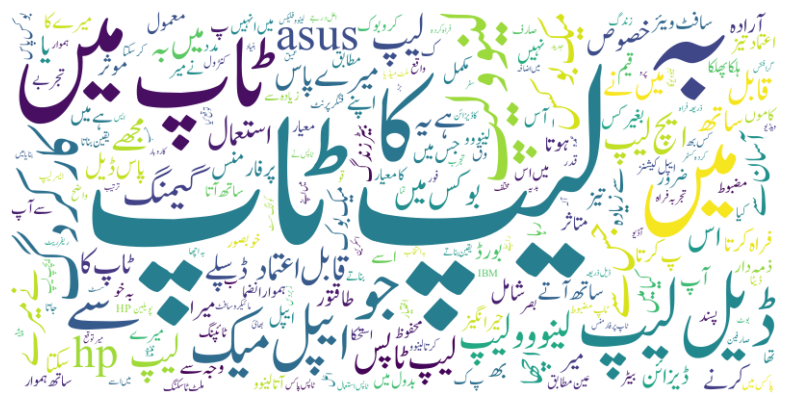

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

import os

# Specify the font file name
font_filename = "/content/drive/MyDrive/NLP1_CSE431/for_urdu/urdu_dataset/Jameel Noori Nastaleeq.ttf"

# Get the absolute path to the font file
font_path = os.path.abspath(font_filename)


# Filter the data for label = 1
label_1_data = df[df['label'] == 1]

# Convert Urdu comments to a single string
urdu_text = ' '.join(map(str, label_1_data['comment'].apply(lambda x: ' '.join(x))))

# Create a WordCloud object with appropriate settings for Urdu text
wordcloud = WordCloud(width=800, height=400, font_path=font_path, background_color='white').generate(urdu_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


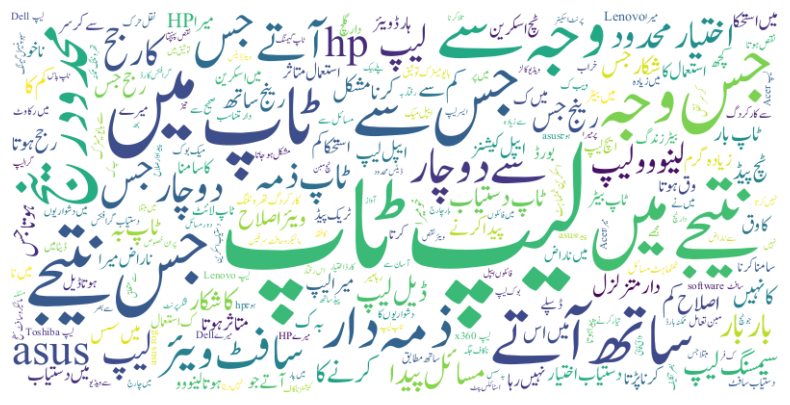

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Specify the font file name
font_filename = "/content/drive/MyDrive/NLP1_CSE431/for_urdu/urdu_dataset/Jameel Noori Nastaleeq.ttf"

# Get the absolute path to the font file
font_path = os.path.abspath(font_filename)


# Filter the data for label = 1
label_1_data = df[df['label'] == 0]

# Convert Urdu comments to a single string
urdu_text = ' '.join(map(str, label_1_data['comment'].apply(lambda x: ' '.join(x))))

# Create a WordCloud object with appropriate settings for Urdu text
wordcloud = WordCloud(width=800, height=400, font_path=font_path, background_color='white').generate(urdu_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


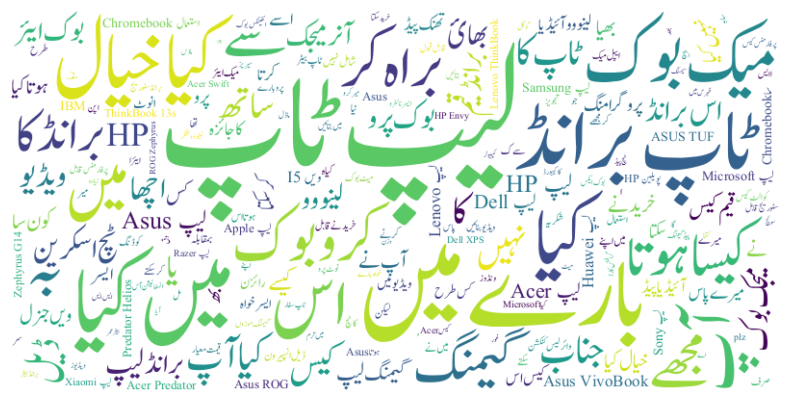

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Specify the font file name
font_filename = "/content/drive/MyDrive/NLP1_CSE431/for_urdu/urdu_dataset/Jameel Noori Nastaleeq.ttf"

# Get the absolute path to the font file
font_path = os.path.abspath(font_filename)


# Filter the data for label = 2
label_2_data = df[df['label'] == 2]

# Convert Urdu comments to a single string
urdu_text = ' '.join(map(str, label_2_data['comment'].apply(lambda x: ' '.join(x))))

# Create a WordCloud object with appropriate settings for Urdu text
wordcloud = WordCloud(width=800, height=400, font_path=font_path, background_color='white').generate(urdu_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


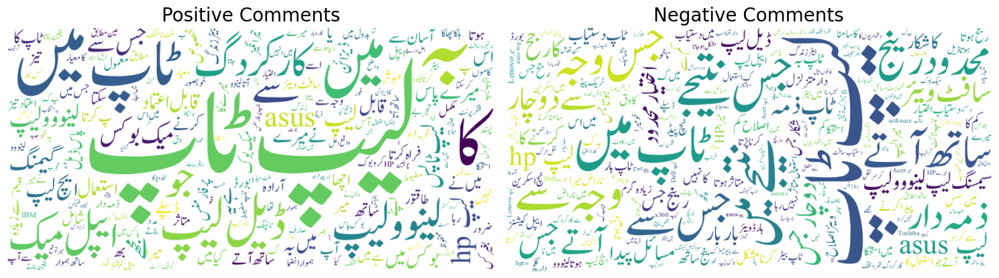

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

font_filename = "/content/drive/MyDrive/NLP1_CSE431/for_urdu/urdu_dataset/Jameel Noori Nastaleeq.ttf"

font_path = os.path.abspath(font_filename)

label_1_data = df[df['label'] == 1]
label_0_data = df[df['label'] == 0]


urdu_text_1 = ' '.join(map(str, label_1_data['comment'].apply(lambda x: ' '.join(x))))
urdu_text_0 = ' '.join(map(str, label_0_data['comment'].apply(lambda x: ' '.join(x))))

wordcloud_1 = WordCloud(width=800, height=400, font_path=font_path, background_color='white').generate(urdu_text_1)
wordcloud_0 = WordCloud(width=800, height=400, font_path=font_path, background_color='white').generate(urdu_text_0)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_1, interpolation='bilinear')
plt.title('Positive Comments', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_0, interpolation='bilinear')
plt.title('Negative Comments', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()


### Top Ten Laptop Brands

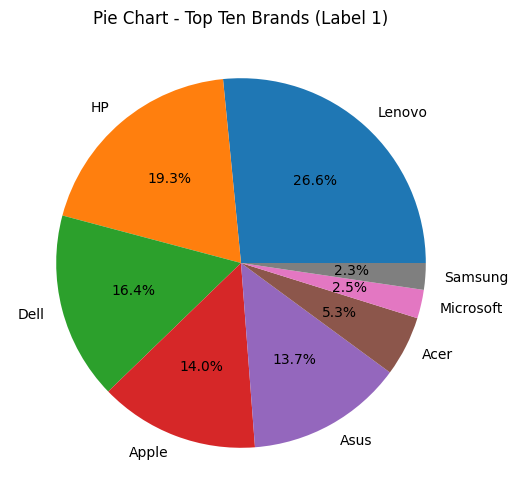

In [ ]:
import matplotlib.pyplot as plt

label_1_data = df[df['label'] == 1]

brand_counts = label_1_data['brand'].value_counts()

top_ten_brands = brand_counts.head(8)

sizes = top_ten_brands.values
labels = top_ten_brands.index


plt.figure(figsize=(8, 6))

# Create the pie chart
plt.pie(sizes, labels=labels, autopct='%1.1f%%')

# Add title
plt.title('Pie Chart - Top Ten Brands (Label 1)')

# Display the plot
plt.show()


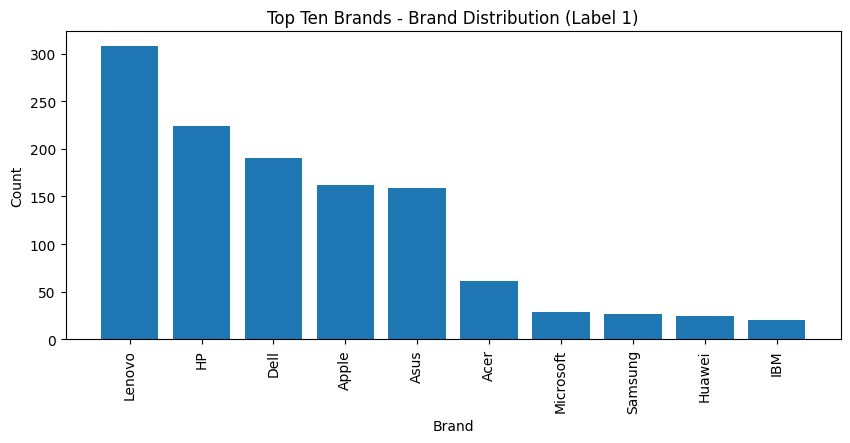

In [ ]:
import matplotlib.pyplot as plt

# Filter the data for label = 1
label_1_data = df[df['label'] == 1]

# Group the filtered data by brand and count the occurrences
brand_counts = label_1_data['brand'].value_counts()

# Select the top ten brands
top_ten_brands = brand_counts.head(10)
plt.figure(figsize=(10, 4))
# Create a bar chart
labels = top_ten_brands.index
counts = top_ten_brands.values
plt.bar(labels, counts)

# Add labels and title
plt.xlabel('Brand')
plt.ylabel('Count')
plt.title('Top Ten Brands - Brand Distribution (Label 1)')

# Rotate x-axis labels
plt.xticks(rotation='vertical')

# Display the plot
plt.show()


### Male Female ratio pie chart

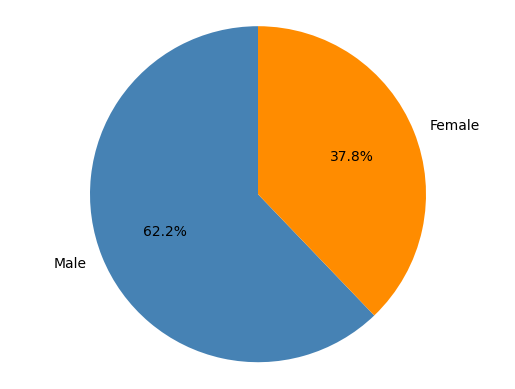

In [ ]:
import matplotlib.pyplot as plt

# Calculate the counts of males and females
male_count = df[df['gender'] == 'Male'].shape[0]
female_count = df[df['gender'] == 'Female'].shape[0]

# Create a pie chart
labels = ['Male', 'Female']
sizes = [male_count, female_count]
colors = ['SteelBlue', 'darkorange']
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)

# Add title
# plt.title('Male-Female Ratio')


plt.axis('equal')

# Display the chart
plt.show()

### Product Demand Analysis Based on Gender

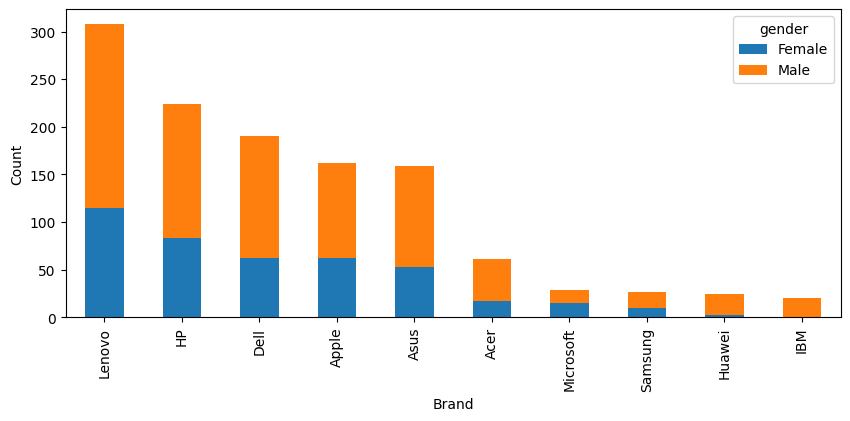

In [ ]:
import matplotlib.pyplot as plt

# Filter the data for label = 1
label_0_data = df[df['label'] == 1]

# Group the filtered data by brand and gender and count the occurrences
gender_brand_counts = label_0_data.groupby(['brand', 'gender']).size().unstack()

# Calculate the total count of each brand
brand_totals = gender_brand_counts.sum(axis=1)

# Select the top ten brands
top_ten_brands = brand_totals.nlargest(10).index

# Filter the data for the top ten brands
top_ten_gender_brand_counts = gender_brand_counts.loc[top_ten_brands]

# Create a stacked bar chart
top_ten_gender_brand_counts.plot(kind='bar', stacked=True, figsize=(10, 4))

# Add labels and title
plt.xlabel('Brand')
plt.ylabel('Count')
# plt.title('Brand Distribution by Gender (Label 1) - Top Ten Brands')

# Display the plot
plt.show()


### Product Demand Analysis Based on male

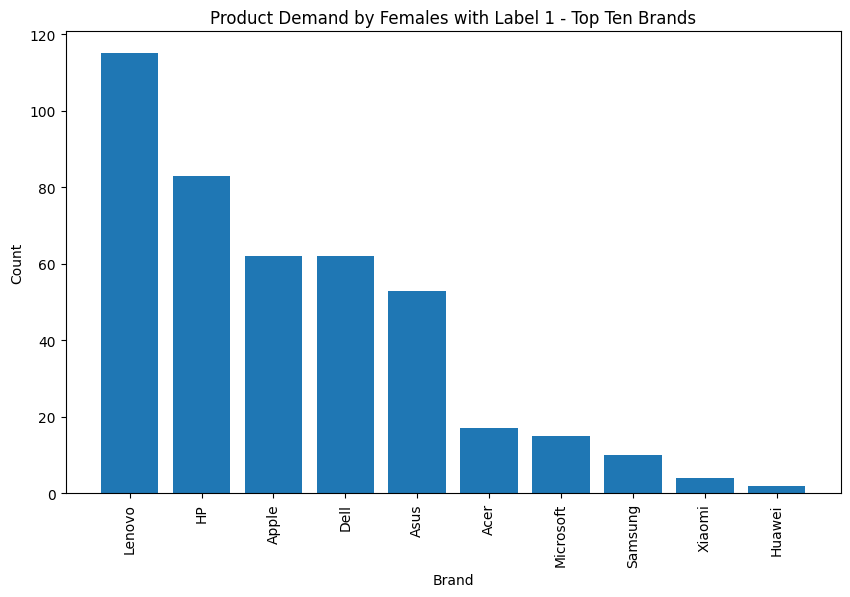

In [ ]:
import matplotlib.pyplot as plt

# Filter the data for females with label = 1
female_label_1_data = df[(df['gender'] == 'Female') & (df['label'] == 1)]

# Group the filtered data by brand and count the occurrences
brand_counts = female_label_1_data['brand'].value_counts()

# Select the top ten brands
top_ten_brands = brand_counts.nlargest(10).index

# Filter the data for the top ten brands
top_ten_brand_counts = brand_counts[top_ten_brands]

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_ten_brand_counts.index, top_ten_brand_counts)

# Add labels and title
plt.xlabel('Brand')
plt.ylabel('Count')
plt.title('Product Demand by Females with Label 1 - Top Ten Brands')

# Rotate x-axis labels for better readability if needed
plt.xticks(rotation=90)

# Display the plot
plt.show()


### Product Demand Analysis Based on female

---



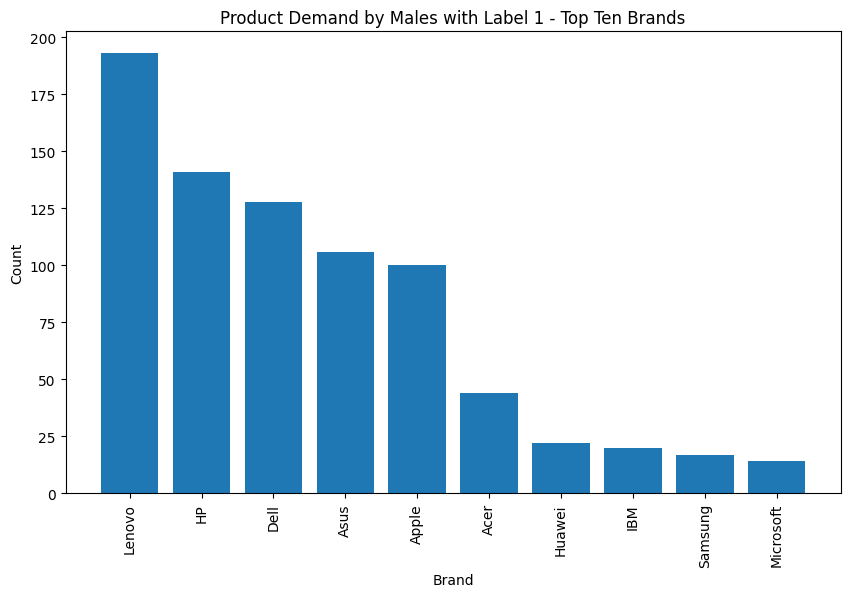

In [ ]:
import matplotlib.pyplot as plt

# Filter the data for females with label = 1
female_label_1_data = df[(df['gender'] == 'Male') & (df['label'] == 1)]

# Group the filtered data by brand and count the occurrences
brand_counts = female_label_1_data['brand'].value_counts()

# Select the top ten brands
top_ten_brands = brand_counts.nlargest(10).index

# Filter the data for the top ten brands
top_ten_brand_counts = brand_counts[top_ten_brands]

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_ten_brand_counts.index, top_ten_brand_counts)

# Add labels and title
plt.xlabel('Brand')
plt.ylabel('Count')
plt.title('Product Demand by Males with Label 1 - Top Ten Brands')

# Rotate x-axis labels for better readability if needed
plt.xticks(rotation=90)

# Display the plot
plt.show()


## **Model Building**

### CountVectorizer

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [ ]:
x = np.array(df["comment"])
y = np.array(df["label"])

In [ ]:
cv = CountVectorizer()
X = cv.fit_transform(df['comment'].apply(lambda x: ' '.join(x)))
y = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=8)


### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
accuracy1 = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy1)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Accuracy: 0.9329805996472663
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       378
         1.0       0.94      0.91      0.92       383
         2.0       0.92      0.93      0.92       373

    accuracy                           0.93      1134
   macro avg       0.93      0.93      0.93      1134
weighted avg       0.93      0.93      0.93      1134



In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=44df8368527c5c5a4ba89145a09b57a9caf3945205980aaec8d39593bd32f7b4
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


Accuracy: 0.9329805996472663
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       378
         1.0       0.94      0.91      0.92       383
         2.0       0.92      0.93      0.92       373

    accuracy                           0.93      1134
   macro avg       0.93      0.93      0.93      1134
weighted avg       0.93      0.93      0.93      1134



<ipython-input-192-4538c15ed6ec>:51: UserWarning: Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.
  explanation_plot.savefig('N1.png', dpi=300, bbox_inches='tight')
<ipython-input-192-4538c15ed6ec>:51: UserWarning: Matplotlib currently does not support Arabic natively.
  explanation_plot.savefig('N1.png', dpi=300, bbox_inches='tight')
<ipython-input-192-4538c15ed6ec>:51: UserWarning: Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missing from current font.
  explanation_plot.savefig('N1.png', dpi=300, bbox_inches='tight')
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Matplotlib currently does not support Arabic natively.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missin

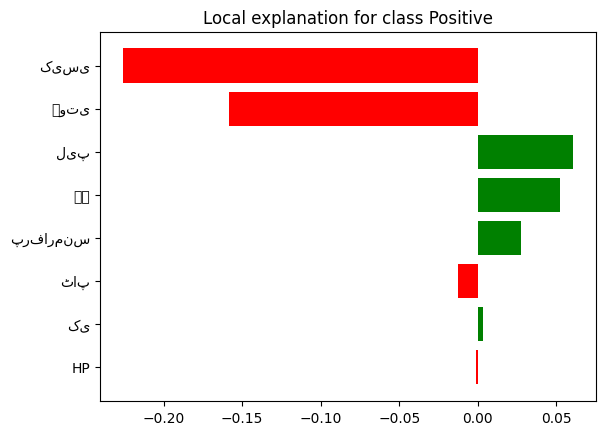

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from lime.lime_text import LimeTextExplainer
from sklearn.feature_extraction.text import CountVectorizer

# Initialize CountVectorizer
cv = CountVectorizer()
X = cv.fit_transform(df['comment'].apply(lambda x: ' '.join(x)))

y = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=8)

# Initialize Logistic Regression model
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs')
logreg.fit(X_train, y_train)

# Make predictions on test set
y_pred = logreg.predict(X_test)

# Calculate accuracy
accuracy1 = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy1)

# Generate classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Initialize LIME explainer for text classification
explainer_lime = LimeTextExplainer(class_names=["Negative", "Positive", "Neutral"])

# Define prediction function for LIME
predict_fn_logreg = lambda x: logreg.predict_proba(cv.transform(x))

# Index of instance to explain
index_to_explain = 70

# Get the text instance to explain
text_instance_to_explain = df['comment'].iloc[index_to_explain]

# Explain instance using LIME
exp = explainer_lime.explain_instance(' '.join(text_instance_to_explain), predict_fn_logreg, num_features=10)

# Show explanation
exp.show_in_notebook(text=True)
# Save explanation plot to a .png file
explanation_plot = exp.as_pyplot_figure()
explanation_plot.savefig('N1.png', dpi=300, bbox_inches='tight')

In [ ]:
# Initialize LIME explainer for text classification
explainer_lime = LimeTextExplainer(class_names=["Negative", "Positive", "Neutral"])

# Define prediction function for LIME
predict_fn_logreg = lambda x: logreg.predict_proba(cv.transform(x))

# Index of instance to explain
index_to_explain = 890

# Get the text instance to explain
text_instance_to_explain = df['comment'].iloc[index_to_explain]

# Explain instance using LIME
exp = explainer_lime.explain_instance(' '.join(text_instance_to_explain), predict_fn_logreg, num_features=10)

# Show explanation
exp.show_in_notebook(text=True)

In [ ]:
# Initialize LIME explainer for text classification
explainer_lime = LimeTextExplainer(class_names=["Negative", "Positive", "Neutral"])

# Define prediction function for LIME
predict_fn_logreg = lambda x: logreg.predict_proba(cv.transform(x))

# Index of instance to explain
index_to_explain = 752

# Get the text instance to explain
text_instance_to_explain = df['comment'].iloc[index_to_explain]

# Explain instance using LIME
exp = explainer_lime.explain_instance(' '.join(text_instance_to_explain), predict_fn_logreg, num_features=10)

# Show explanation
exp.show_in_notebook(text=True)

### NB

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
naive_bayes = MultinomialNB()
naive_bayes.fit(X_train, y_train)
y_pred = naive_bayes.predict(X_test)
accuracy2 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.92      0.95       119
         1.0       0.94      0.80      0.86       130
         2.0       0.80      0.95      0.87       129

    accuracy                           0.89       378
   macro avg       0.90      0.89      0.89       378
weighted avg       0.90      0.89      0.89       378



In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
naive_bayes = MultinomialNB()
naive_bayes.fit(X_train, y_train)
y_pred = naive_bayes.predict(X_test)
accuracy2 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.94      0.95       235
         1.0       0.96      0.84      0.89       279
         2.0       0.81      0.95      0.87       242

    accuracy                           0.90       756
   macro avg       0.91      0.91      0.91       756
weighted avg       0.91      0.90      0.90       756



### SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
svm = SVC()
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
accuracy3 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98       119
         1.0       0.97      0.88      0.92       130
         2.0       0.86      0.97      0.91       129

    accuracy                           0.94       378
   macro avg       0.94      0.94      0.94       378
weighted avg       0.94      0.94      0.94       378



In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
svm = SVC()
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
accuracy3 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.93      0.95       235
         1.0       0.93      0.91      0.92       279
         2.0       0.88      0.95      0.91       242

    accuracy                           0.93       756
   macro avg       0.93      0.93      0.93       756
weighted avg       0.93      0.93      0.93       756



### Random Forest Classifier AND Explainable AI

In [ ]:
pip install shap

In [ ]:
!pip install lime

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.94      0.95       367
         1.0       0.91      0.90      0.91       397
         2.0       0.90      0.94      0.92       370

    accuracy                           0.93      1134
   macro avg       0.93      0.93      0.93      1134
weighted avg       0.93      0.93      0.93      1134



 99%|===================| 3366/3402 [02:07<00:01]       No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missing from current font.
Matplotlib currently does not support Arabic natively.
Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.
Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missing from current font.
Matplotlib currently does not support Arabic natively.
Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.


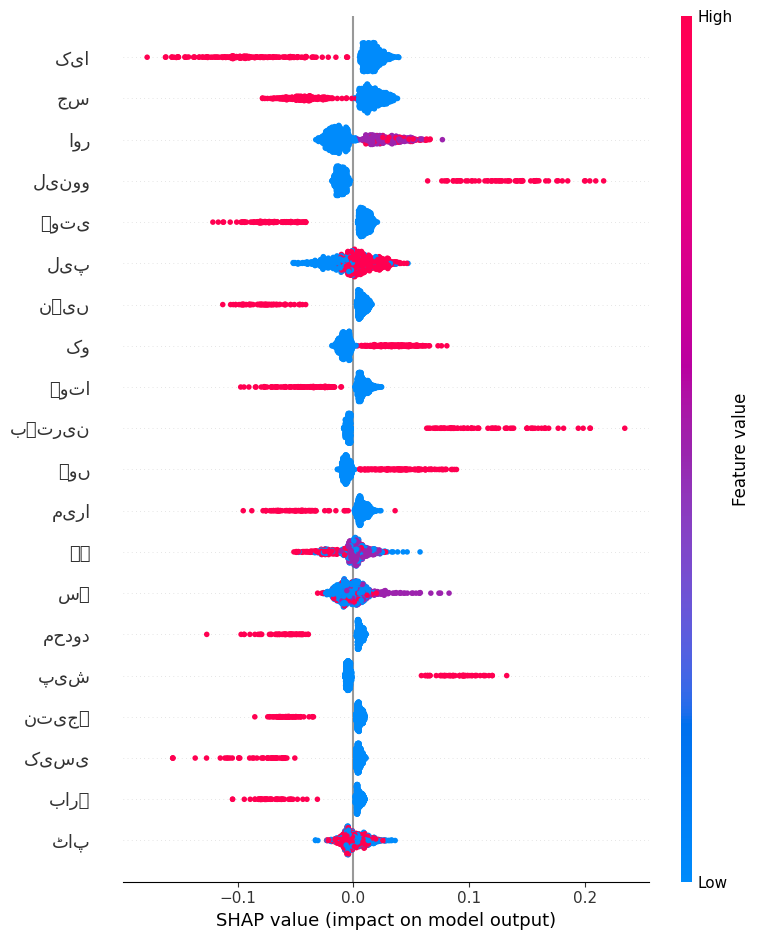

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from gensim.models import Word2Vec
import shap
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer()
X = cv.fit_transform(df['comment'].apply(lambda x: ' '.join(x)))

y = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy4 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()
explainer_shap = shap.Explainer(rf, X_train_dense)

# Calculate SHAP values for the test data using dense NumPy arrays
shap_values = explainer_shap.shap_values(X_test_dense)
shap.summary_plot(shap_values[1], X_test_dense, feature_names=cv.get_feature_names_out())
index_to_explain = 70
shap.force_plot(explainer_shap.expected_value[1], shap_values[1][index_to_explain], X_test_dense[index_to_explain], feature_names=cv.get_feature_names_out())

# Initialize LIME explainer for text classification
explainer_lime = LimeTextExplainer(class_names=["Negative", "Positive", "Neutral"])
predict_fn_rf = lambda x: rf.predict_proba(cv.transform(x)).astype(float)
instance_to_explain = X_test_dense[index_to_explain]
text_instance_to_explain = df['comment'].iloc[index_to_explain]
exp = explainer_lime.explain_instance(' '.join(text_instance_to_explain), predict_fn_rf, num_features=10)

exp.show_in_notebook(text=True)


100%|===================| 3393/3402 [02:41<00:00]       No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.
Matplotlib currently does not support Arabic natively.
Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missing from current font.
Glyph 1729 (\N{ARABIC LETTER HEH GOAL}) missing from current font.
Matplotlib currently does not support Arabic natively.
Glyph 1746 (\N{ARABIC LETTER YEH BARREE}) missing from current font.


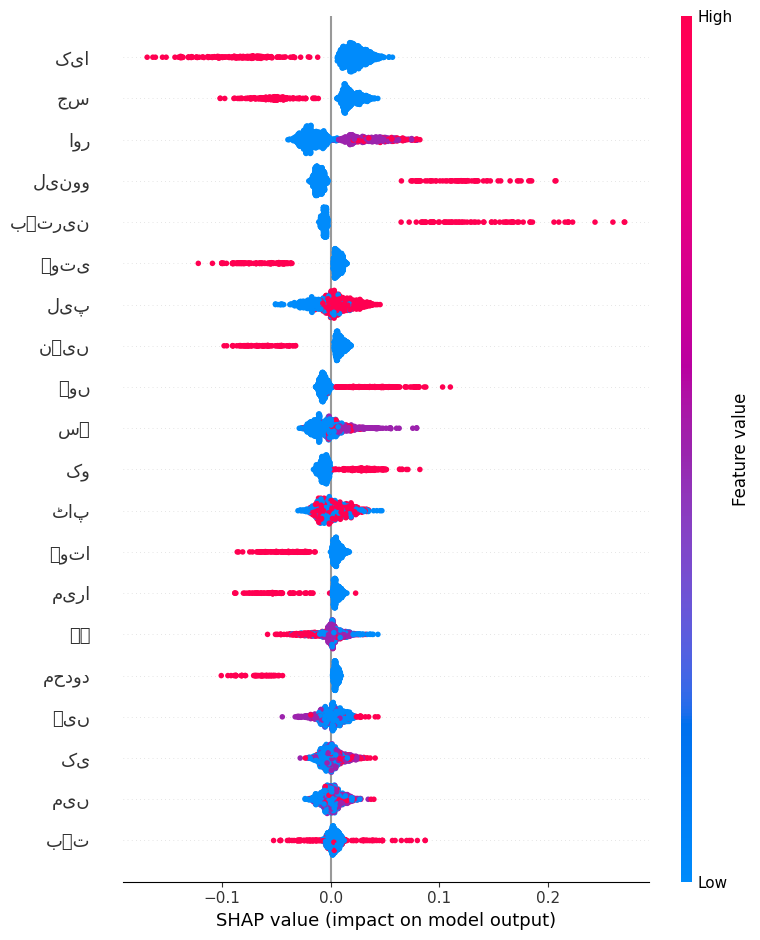

In [ ]:
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()
explainer_shap = shap.Explainer(rf, X_train_dense)

# Calculate SHAP values for the test data using dense NumPy arrays
shap_values = explainer_shap.shap_values(X_test_dense)
shap.summary_plot(shap_values[1], X_test_dense, feature_names=cv.get_feature_names_out())
index_to_explain = 890
shap.force_plot(explainer_shap.expected_value[1], shap_values[1][index_to_explain], X_test_dense[index_to_explain], feature_names=cv.get_feature_names_out())

# Initialize LIME explainer for text classification
explainer_lime = LimeTextExplainer(class_names=["Negative", "Positive", "Neutral"])
predict_fn_rf = lambda x: rf.predict_proba(cv.transform(x)).astype(float)
instance_to_explain = X_test_dense[index_to_explain]
text_instance_to_explain = df['comment'].iloc[index_to_explain]
exp = explainer_lime.explain_instance(' '.join(text_instance_to_explain), predict_fn_rf, num_features=10)

exp.show_in_notebook(text=True)

100%|===================| 2262/2268 [01:52<00:00]       

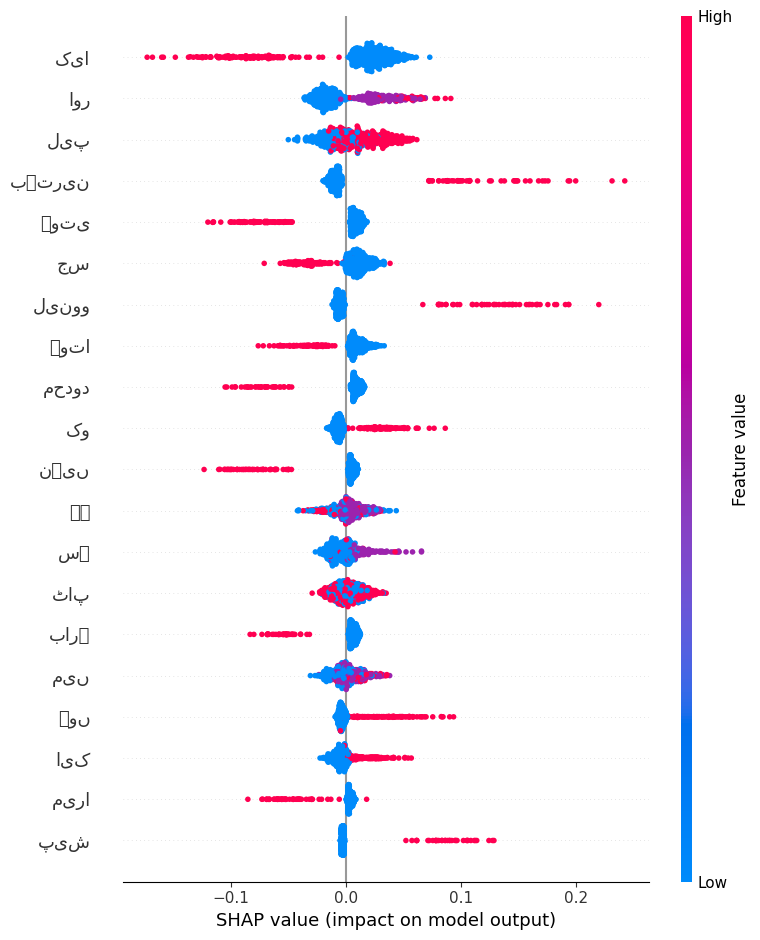

In [ ]:
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()
explainer_shap = shap.Explainer(rf, X_train_dense)

# Calculate SHAP values for the test data using dense NumPy arrays
shap_values = explainer_shap.shap_values(X_test_dense)
shap.summary_plot(shap_values[1], X_test_dense, feature_names=cv.get_feature_names_out())
index_to_explain = 752
shap.force_plot(explainer_shap.expected_value[1], shap_values[1][index_to_explain], X_test_dense[index_to_explain], feature_names=cv.get_feature_names_out())

# Initialize LIME explainer for text classification
explainer_lime = LimeTextExplainer(class_names=["Negative", "Positive", "Neutral"])
predict_fn_rf = lambda x: rf.predict_proba(cv.transform(x)).astype(float)
instance_to_explain = X_test_dense[index_to_explain]
text_instance_to_explain = df['comment'].iloc[index_to_explain]
exp = explainer_lime.explain_instance(' '.join(text_instance_to_explain), predict_fn_rf, num_features=10)

exp.show_in_notebook(text=True)

In [ ]:
# Select a single comment for prediction
comment = "طلباء کو گیمنگ لیپ ٹاپ کی ضرورت ہے"
# Transform the comment using the same CountVectorizer instance
comment_transformed = cv.transform([comment])

# Make prediction on the transformed comment
prediction = rf.predict(comment_transformed)

# Print the predicted label
if prediction[0] == 0:
  print("Negative Comment")
elif prediction[0] == 1:
  print("Postive Comment")
else:
  print("Nutral Comment")



### Gradient Boosting Classifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
accuracy5 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.91      0.94       119
         1.0       0.89      0.86      0.88       130
         2.0       0.86      0.94      0.90       129

    accuracy                           0.90       378
   macro avg       0.91      0.90      0.90       378
weighted avg       0.90      0.90      0.90       378



In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
accuracy5 = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       235
         1.0       0.87      0.87      0.87       279
         2.0       0.89      0.91      0.90       242

    accuracy                           0.90       756
   macro avg       0.90      0.90      0.90       756
weighted avg       0.90      0.90      0.90       756



### RNN

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['comment'])
sequences = tokenizer.texts_to_sequences(df['comment'])
max_sequence_length = 500
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length)
X_train, X_test, y_train, y_test = train_test_split(padded_sequences, df['label'], test_size=0.2, random_state=42)

num_classes = 3

model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=100, input_length=max_sequence_length))
model.add(LSTM(units=100))
model.add(Dense(units=num_classes, activation='softmax'))
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(X_train, y_train, epochs=10, batch_size=32,validation_split=0.2)

Epoch 1/10
76/76 [==============================] - 45s 553ms/step - loss: 0.7460 - accuracy: 0.6482 - val_loss: 0.3063 - val_accuracy: 0.8860
Epoch 2/10
76/76 [==============================] - 42s 555ms/step - loss: 0.2502 - accuracy: 0.9123 - val_loss: 0.2269 - val_accuracy: 0.9273
Epoch 3/10
76/76 [==============================] - 43s 569ms/step - loss: 0.1166 - accuracy: 0.9603 - val_loss: 0.1991 - val_accuracy: 0.9223
Epoch 4/10
76/76 [==============================] - 43s 569ms/step - loss: 0.0529 - accuracy: 0.9851 - val_loss: 0.2368 - val_accuracy: 0.9289
Epoch 5/10
76/76 [==============================] - 50s 657ms/step - loss: 0.0294 - accuracy: 0.9913 - val_loss: 0.2441 - val_accuracy: 0.9322
Epoch 6/10
76/76 [==============================] - 52s 677ms/step - loss: 0.0171 - accuracy: 0.9954 - val_loss: 0.3404 - val_accuracy: 0.9124
Epoch 7/10
76/76 [==============================] - 43s 568ms/step - loss: 0.0168 - accuracy: 0.9963 - val_loss: 0.3124 - val_accuracy: 0.9273

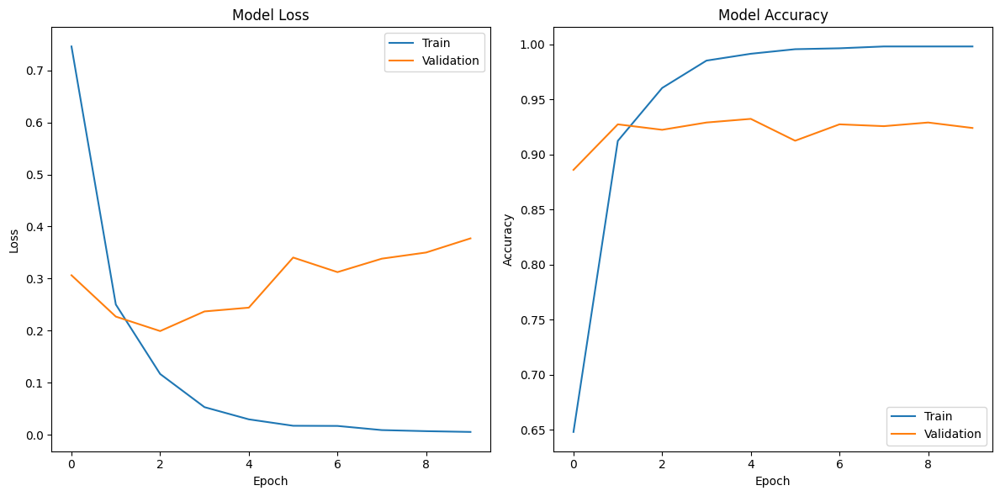

24/24 [==============================] - 5s 204ms/step
Accuracy: 0.9351851851851852
Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.96      0.97       235
         1.0       0.91      0.92      0.92       279
         2.0       0.93      0.93      0.93       242

    accuracy                           0.94       756
   macro avg       0.94      0.94      0.94       756
weighted avg       0.94      0.94      0.94       756



In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()

# Evaluate the model
y_pred_prob = model.predict(X_test)
y_pred = y_pred_prob.argmax(axis=-1)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

### CNN

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['comment'])
sequences = tokenizer.texts_to_sequences(df['comment'])
max_sequence_length = 400
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length)
X_train, X_test, y_train, y_test = train_test_split(padded_sequences, df['label'], test_size=0.2, random_state=42)

num_classes = 3

# Create the CNN model
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=100, input_length=max_sequence_length))
model.add(Conv1D(filters=128, kernel_size=5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(units=num_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, batch_size=32,validation_split=0.2)






Epoch 1/10
76/76 [==============================] - 14s 179ms/step - loss: 0.7997 - accuracy: 0.6954 - val_loss: 0.4768 - val_accuracy: 0.8281
Epoch 2/10
76/76 [==============================] - 21s 273ms/step - loss: 0.2933 - accuracy: 0.9052 - val_loss: 0.2507 - val_accuracy: 0.9273
Epoch 3/10
76/76 [==============================] - 11s 142ms/step - loss: 0.1139 - accuracy: 0.9702 - val_loss: 0.2023 - val_accuracy: 0.9306
Epoch 4/10
76/76 [==============================] - 13s 169ms/step - loss: 0.0486 - accuracy: 0.9905 - val_loss: 0.2040 - val_accuracy: 0.9306
Epoch 5/10
76/76 [==============================] - 13s 167ms/step - loss: 0.0234 - accuracy: 0.9971 - val_loss: 0.2125 - val_accuracy: 0.9256
Epoch 6/10
76/76 [==============================] - 13s 167ms/step - loss: 0.0133 - accuracy: 0.9979 - val_loss: 0.2249 - val_accuracy: 0.9256
Epoch 7/10
76/76 [==============================] - 13s 167ms/step - loss: 0.0090 - accuracy: 0.9979 - val_loss: 0.2382 - val_accuracy: 0.9240

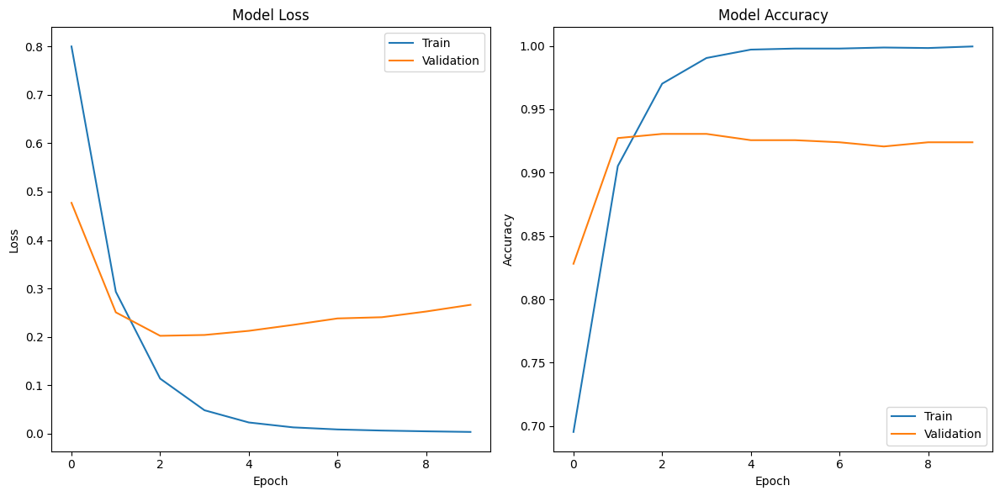

24/24 [==============================] - 1s 36ms/step
Accuracy: 0.9232804232804233
Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      0.93      0.94       235
         1.0       0.92      0.90      0.91       279
         2.0       0.89      0.95      0.92       242

    accuracy                           0.92       756
   macro avg       0.92      0.92      0.92       756
weighted avg       0.92      0.92      0.92       756



In [ ]:
# Plotting the loss and accuracy
plt.figure(figsize=(12, 6))

# Plot training & validation loss values
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Plot training & validation accuracy values
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()

# Evaluate the model
y_pred_prob = model.predict(X_test)
y_pred = y_pred_prob.argmax(axis=-1)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

###LSTM

Epoch 1/10
76/76 [==============================] - 49s 623ms/step - loss: 0.7192 - accuracy: 0.6867 - val_loss: 0.3582 - val_accuracy: 0.8645
Epoch 2/10
76/76 [==============================] - 49s 643ms/step - loss: 0.2177 - accuracy: 0.9247 - val_loss: 0.2336 - val_accuracy: 0.9157
Epoch 3/10
76/76 [==============================] - 44s 575ms/step - loss: 0.0977 - accuracy: 0.9702 - val_loss: 0.1935 - val_accuracy: 0.9322
Epoch 4/10
76/76 [==============================] - 51s 680ms/step - loss: 0.0461 - accuracy: 0.9880 - val_loss: 0.2713 - val_accuracy: 0.9207
Epoch 5/10
76/76 [==============================] - 44s 577ms/step - loss: 0.0595 - accuracy: 0.9822 - val_loss: 0.2570 - val_accuracy: 0.9256
Epoch 6/10
76/76 [==============================] - 43s 570ms/step - loss: 0.0230 - accuracy: 0.9946 - val_loss: 0.2436 - val_accuracy: 0.9289
Epoch 7/10
76/76 [==============================] - 43s 569ms/step - loss: 0.0109 - accuracy: 0.9967 - val_loss: 0.2596 - val_accuracy: 0.9405

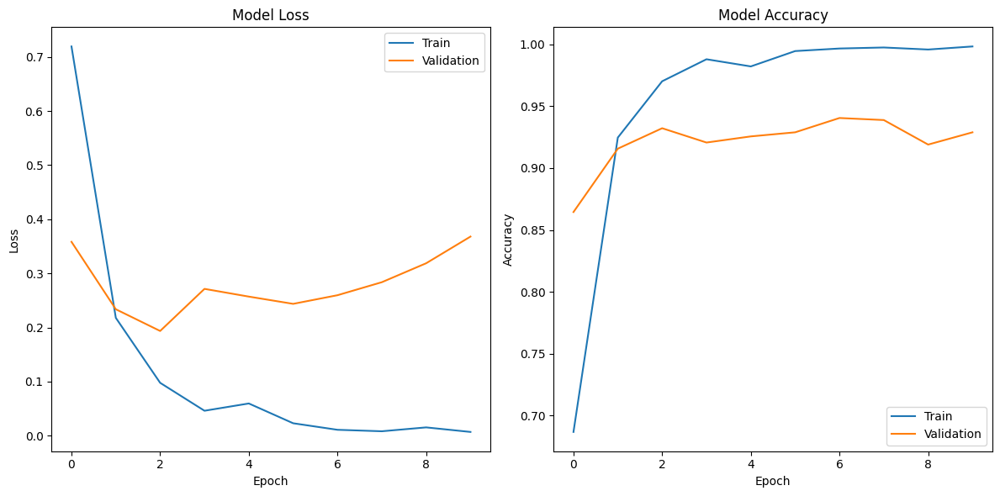

24/24 [==============================] - 3s 117ms/step
Accuracy: 0.9246031746031746
Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.94      0.95       235
         1.0       0.90      0.91      0.91       279
         2.0       0.91      0.93      0.92       242

    accuracy                           0.92       756
   macro avg       0.93      0.93      0.93       756
weighted avg       0.93      0.92      0.92       756



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['comment'])
sequences = tokenizer.texts_to_sequences(df['comment'])

max_sequence_length = 500
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length)

X_train, X_test, y_train, y_test = train_test_split(padded_sequences, df['label'], test_size=0.2, random_state=42)

num_classes = 3

# Create the LSTM model
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=100, input_length=max_sequence_length))
model.add(LSTM(units=100))
model.add(Dense(units=num_classes, activation='softmax'))


model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()

# Evaluate the model
y_pred_prob = model.predict(X_test)
y_pred = y_pred_prob.argmax(axis=-1)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)


### BERT

In [ ]:
pip install transformers

In [ ]:
!pip install tensorflow_text

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text

In [ ]:

dfbert = dfbert[dfbert['label'] != 2.0]

In [ ]:
dfbert

,comment,user_name,brand,gender,label
0,میں نے حال ہی میں ایک ڈیل لیپ ٹاپ خریدا تھا ، ...,Muhammad Ahmed,Dell,Male,1.0
1,میں برسوں سے ایک hp لیپ ٹاپ استعمال کر رہا ہوں...,Fatima Ali,HP,Female,1.0
2,لینووو لیپ ٹاپ لاجواب ہیں۔کی بورڈ ٹائپ کرنے می...,Ali Hassan,Lenovo,Male,1.0
3,ایپل میک بوکس وہاں کے بہترین لیپ ٹاپ ہیں۔ڈیزائ...,Aisha Khan,Apple,Female,1.0
4,میں asus لیپ ٹاپ کا بہت بڑا پرستار ہوں۔وہ طاقت...,Usman Malik,Asus,Male,1.0
...,...,...,...,...,...
3327,لینووو آئیڈیا پیڈ لیپ ٹاپ حرارتی نظام کے متوات...,Benjamin,Lenovo,Male,0.0
3328,hp لیپ ٹاپ کا بھاری اور بہت بڑا ڈیزائن ہے ، جس...,Adnan Malik,HP,Male,0.0
3329,My HP laptop freezes frequently,Tariq Khan,HP,Male,0.0
3330,ایچ پی لیپ ٹاپ میں ایک سست اور غیر ذمہ دار ٹچ ...,Kamran Ali,HP,Male,0.0


In [ ]:
dfbert.groupby('label').describe()

comment                                                                 \
        count unique                                                top freq   
label                                                                          
0.0      1259    849  میرا Acer لیپ ٹاپ بہت سست چلتا ہے۔ 🐌 میں تو بس...    4   
1.0      1259   1223  لینوو یوگا بوک c940 بہترین قابلیتوں کے ساتھ آت...    3   

      user_name                               brand                      \
          count unique               top freq count unique     top freq   
label                                                                     
0.0        1259    475  Shahista Khatoon   46  1259     28  Lenovo  215   
1.0        1259    844         Miss Zuha   12  1259     27  Lenovo  308   

      gender                    
       count unique   top freq  
label                           
0.0     1259      2  Male  687  
1.0     1259      2  Male  831

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(dfbert['comment'],dfbert['label'], stratify=dfbert['label'])

In [ ]:
X_train.head(4)

1834    گوگل اس لیپ ٹاپ پر کام کرسکتا ہے۔دوسروں کو اس ...
472     جب رازداری اور سلامتی کی بات کی جاتی ہے تو hp ...
1265    ایسر لیپ ٹاپ ورچوئل رئیلٹی ایپلی کیشنز کے لئے ...
1668    لینوو لیجنڈ d15 کا کی بورڈ بہت لیٹ ریسپانس ہوت...
Name: comment, dtype: object

In [ ]:
bert_preprocess = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
bert_encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4")

In [ ]:
# Bert layers
text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
preprocessed_text = bert_preprocess(text_input)
outputs = bert_encoder(preprocessed_text)

# Neural network layers
l = tf.keras.layers.Dropout(0.1, name="dropout")(outputs['pooled_output'])
l = tf.keras.layers.Dense(1, activation='sigmoid', name="output")(l)

# Use inputs and outputs to construct a final model
model = tf.keras.Model(inputs=[text_input], outputs = [l])

In [ ]:
X_train.head(4)

1834    گوگل اس لیپ ٹاپ پر کام کرسکتا ہے۔دوسروں کو اس ...
472     جب رازداری اور سلامتی کی بات کی جاتی ہے تو hp ...
1265    ایسر لیپ ٹاپ ورچوئل رئیلٹی ایپلی کیشنز کے لئے ...
1668    لینوو لیجنڈ d15 کا کی بورڈ بہت لیٹ ریسپانس ہوت...
Name: comment, dtype: object

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 text (InputLayer)           [(None,)]                    0         []                            
                                                                                                  
 keras_layer_4 (KerasLayer)  {'input_type_ids': (None,    0         ['text[0][0]']                
                             128),                                                                
                              'input_word_ids': (None,                                            
                             128),                                                                
                              'input_mask': (None, 128)                                           
                             }                                                              

In [ ]:
len(X_train)

1888

In [ ]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
type(X_train)

pandas.core.series.Series

In [ ]:
model.fit(X_train, y_train, epochs=5)

Epoch 1/5
59/59 [==============================] - 626s 10s/step - loss: 0.6979 - accuracy: 0.5275
Epoch 2/5
59/59 [==============================] - 629s 11s/step - loss: 0.6878 - accuracy: 0.5678
Epoch 3/5
59/59 [==============================] - 627s 11s/step - loss: 0.6607 - accuracy: 0.6139
Epoch 4/5
59/59 [==============================] - 621s 11s/step - loss: 0.6561 - accuracy: 0.6202
Epoch 5/5
59/59 [==============================] - 633s 11s/step - loss: 0.6518 - accuracy: 0.6261


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
y_pred = model.predict(X_test)

y_pred_binary = (y_pred > 0.5).astype(int)

accuracy = accuracy_score(y_test, y_pred_binary)
precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
conf_matrix = confusion_matrix(y_test, y_pred_binary)

# Print the results
print("Performance Report:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("Confusion Matrix:\n", conf_matrix)


20/20 [==============================] - 206s 10s/step
Performance Report:
Accuracy: 0.6730158730158731
Precision: 0.6835016835016835
Recall: 0.6444444444444445
F1-Score: 0.6633986928104575
Confusion Matrix:
 [[221  94]
 [112 203]]


## **Model Evaluation**

### Logistic Regression

In [ ]:

print("Accuracy of Logistic Regression:", accuracy1)

Accuracy of Logistic Regression: 0.9325396825396826


### Multinomial NB

In [ ]:

print("Accuracy of Multinomial NB:", accuracy2)

Accuracy of Multinomial NB: 0.8968253968253969


### SVM

In [ ]:
print("Accuracy of SVM:", accuracy3)

Accuracy of SVM: 0.9272486772486772


### Random Forest Classifier

In [ ]:
print("Accuracy of Random Forest Classifier:", 93)

Accuracy of Random Forest Classifier: 93


### Gradient Boosting Classifier

In [ ]:
print("Accuracy of Gradient Boosting Classifier:", accuracy5)

Accuracy of Gradient Boosting Classifier: 0.8928571428571429


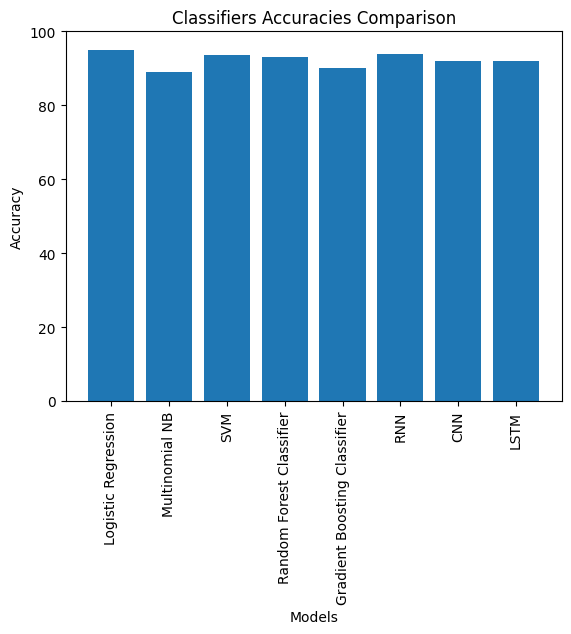

In [ ]:
import matplotlib.pyplot as plt


models = ['Logistic Regression', 'Multinomial NB', 'SVM', 'Random Forest Classifier','Gradient Boosting Classifier','RNN','CNN','LSTM']
accuracies = [accuracy1*100, accuracy2*100, accuracy3*100,.93*100,accuracy5*100,.94*100,.92*100,.92*100]


plt.bar(models, accuracies)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Classifiers Accuracies Comparison')
plt.xticks(rotation='vertical')
plt.ylim(0, 100)

plt.show()


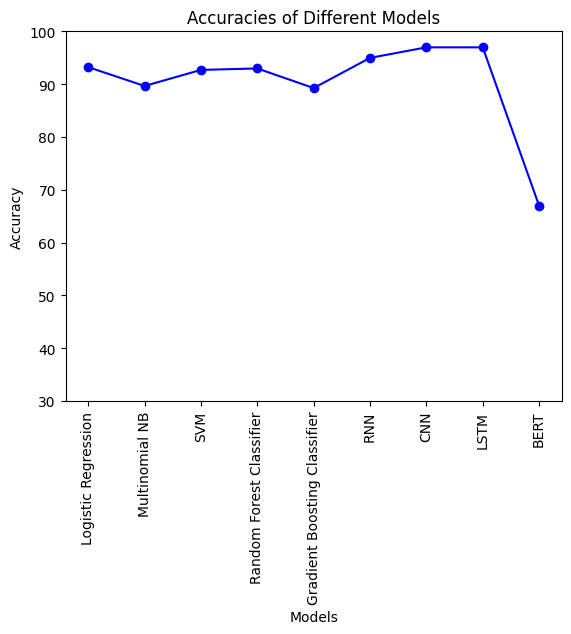

In [ ]:
import matplotlib.pyplot as plt


models = ['Logistic Regression', 'Multinomial NB', 'SVM', 'Random Forest Classifier','Gradient Boosting Classifier','RNN','CNN','LSTM', 'BERT']
accuracies = [accuracy1*100, accuracy2*100, accuracy3*100,.93*100,accuracy5*100,.95*100,.97*100,.97*100, 67]


plt.plot(models, accuracies, marker='o', linestyle='-', color='b')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracies of Different Models')
plt.ylim(30, 100)
plt.xticks(rotation='vertical')


plt.show()
